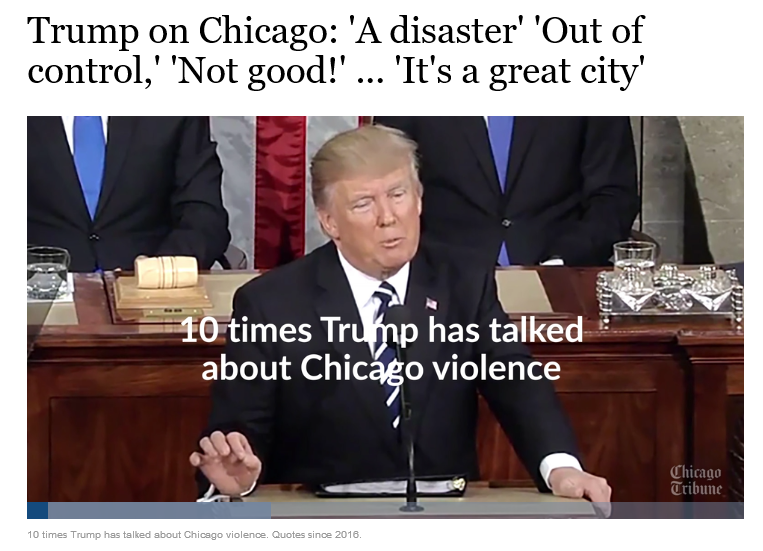

### Deliverables:

- Submit a single zip-compressed file that has the name: YourLastName_Assignment_3 that has the following files:

 1. Your **PDF document** that has your Source code and output
 2. Your **ipynb script** that has your Source code and output


# Objectives:

- Use SQL to execute different queries to retrieve data from Chicago Crime dataset and Police statins dataset
- Use Geospatial queries  to locate **police stations** and **gun** related crimes (with arrest or no arrest) in every district on **Choropleth** map
- Use Geospatial queries  to provide **descriptive stat** for every **district** on Choropleth map
- Use Geospatial queries  to locate the **Block** that is the furthest (Maximum Distance) from the police station that has gun related crime resulted in arrest



Formatting Python Code
When programming in Python, refer to Kenneth Reitz’ PEP 8: The Style Guide for Python Code:
http://pep8.org/ (Links to an external site.)Links to an external site.
There is the Google style guide for Python at
https://google.github.io/styleguide/pyguide.html (Links to an external site.)Links to an external site.
Comment often and in detail.




# Descriptions and Requirement Specifications

## Chicago Crimes

In his first state of the uniion address , president Trump mentioned Chicago violance 10 times __[Trump's State of the Union Address](http://www.chicagotribune.com/news/local/breaking/ct-trump-tweets-quotes-chicago-htmlstory.html)__ 

## Chicago  has more homicides than New York and Los Angeles combined

Columnist Clarence Page wrote an   __[article](http://www.chicagotribune.com/news/opinion/page/ct-perspec-page-trump-murder-rate-jeff-sessions-0103-20180102-story.html)__ , published by the Chicago Tribune stated that the city of Chicago had **more homicides in the past two years than New York and Los Angeles combined**

# Chicago Police Department

Chicago police department  __[CPD](https://home.chicagopolice.org/community/districts/11th-district-harrison/)__  issues and publishes on daily basis on its website crime alerts, and press releases for the different __[districts](https://home.chicagopolice.org/community/districts/)__ .

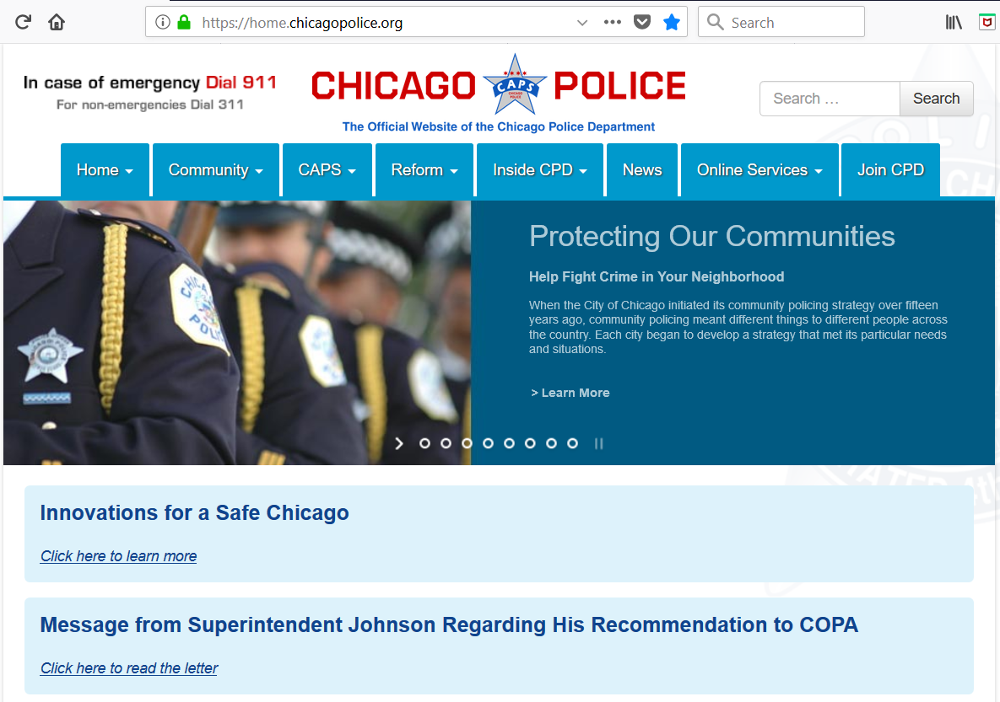



# The CPD categoizes the crimes into 8 categories as follows:

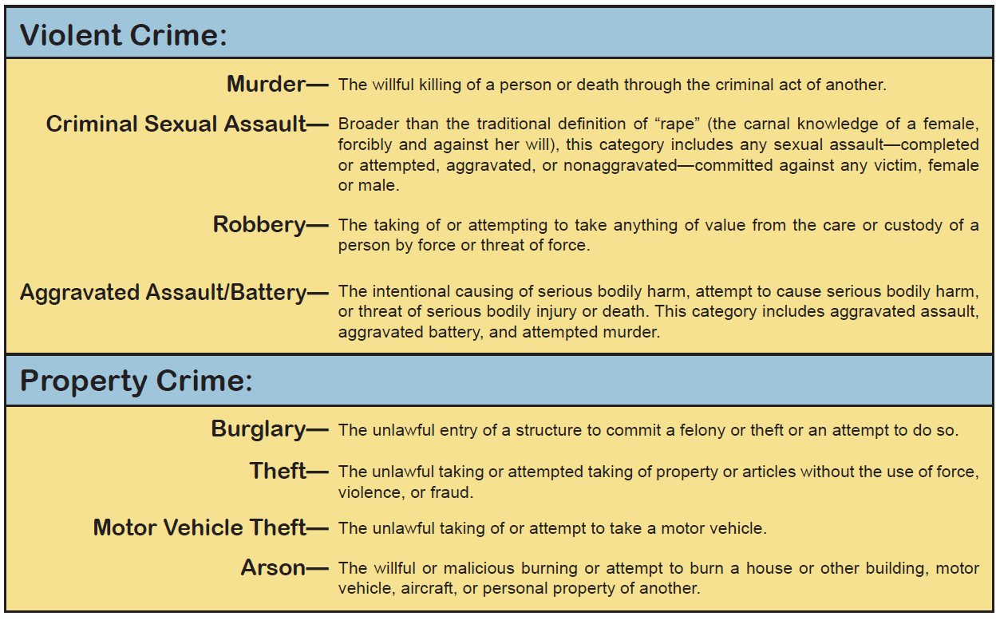


# Chicago Crimes Dataset

The CSV file for crimes dataset for  the city of Chicago is obtained from the data portal for the city of Chicago. Here is the link for the city of Chicago data portal __[City of Chicago Data Portal](https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-present/ijzp-q8t2)__ 




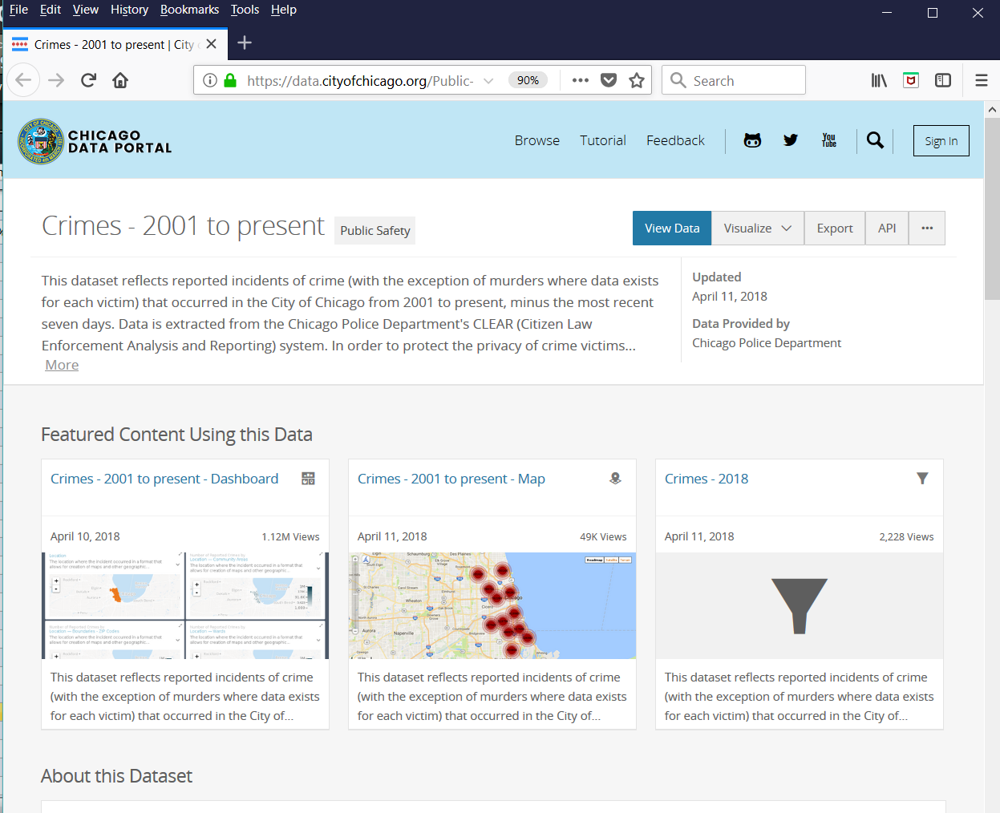

### Loading the Dataset CSV file

Three datasets are need for this assignment:
1. The Chicago police stations in every district
2. The Boundaries.geojson data for district boundries
3. The Crimes dataset 


Lets load the CSV file into a DataFrame object and see the nature of the data that we have.

Complete description of the dataset can be found on Chicago city data portal.

Based on Trumps State of the Uniion Address and the article written by  columnist Clarence Page and  published by the Chicago Tribune, we are interested to retrieve the data for the past two years and perform different types of spatial queries.

There are few of these queries that we are interested in to help CPD and city of Chicago to plot on a Choroplteh map those districts that have highest gun crimes. 

Here are examples of those types of quereis:

1. Plot on **Choropleth map** the **districts** and their **Violent Crimes**
2. Plot on Choropleth map the districts and their **Gun** related crimes
3. Which district is the **crime capital** of **Chicago districts**?
4. What the **crime density** per **district**?
5. Plot on Choropleth map those **gun related crimes** that resulted in **arrests**
5. Plot on Choropleth map the gun related crime that is in the **farthest Block**  from the **policy stattion** for every **district**  




Packages you need to Connect **PostgreSQL** server to load and retrieve Crhicago Crime dataset from the database:
<font color = purple>
1. **psycopg2:** for PostgreSQL driver
2. **area:** to calculate the area inside of any GeoJSON geometry
3. **Folium:** for Choropleth maps </font>


Since we are using PostGIS in our work, please read and bookmark __[Chapter 4. Using PostGIS: Data Management and Queries](https://postgis.net/docs/manual-1.4/ch04.html)__ 


In [1]:
##The easiest way to install packages that are missing is to create a new cell before this one and add the following code

#import sys
#!{sys.executable} -m pip install folium
#!{sys.executable} -m pip install area
#!{sys.executable} -m pip install psycopg2

##This didn't work for a few students last quarter. This is another method:
#!conda install psycopg2 --y

In [2]:
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import psycopg2
import csv
import pandas as pd
import json
from area import area

from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT 

# open the file in mozilla instead of chrome
#jupyter notebook --browser firefox

# IMPORTANT NOTES:
- Use this version of the assignment if you don't want to install PostgreSQL server on your laptop/computer locally to experiment with datbase and tables creation
- In this version of the assignment you will be connecting to DSCC PostgreSQL server that has the database and tables already created on the server. 
- You need to use your NetID and password for login and passward to connect PostgreSQL server hosted on DSCC
- For the psycopg2.connect statements listed below, you must provide your NetID and password in order to connect to PostgreSQL server hosted on DSCC

In [3]:
# All data
db_connection = psycopg2.connect(host='129.105.208.229',dbname="chicago_crimes_ut", user="aso4098" , password="")

# ----------------------------------------------------------------
#   unit test data - less data to use for testing purposes
#db_connection = psycopg2.connect(host='129.105.208.229',dbname="chicago_crimes_ut", user="YourNetID" , password="YourPassword")
# -----------------------------------------------------------------
cursor = db_connection.cursor()

### Chicago Crimes Dataset

The Crimes_2001_to_present.csv is downloaded from Chicago data portal and it has roughly 6.5 million records.

While working on this dataset, It is prudent to make a note of the following:
1. Geospatial  queries are very demanding for system resouces like CPU, Memory, and DISK
1. We are interested in the data set of the past 2 years, and when you execute Geospatial type queries, please be advised that these queries slow down your machine. 
2. Running this script to work on the data of the past 2 years will require roughly 25 minutes to complete. And requires roughly 40 minutes to complete using the dataset of the past 5 years. And requires hours to complete on the entire dataset with at least 16GB memory.
3. It is a good idea to take a slice (past two years) of the dataset and store it, that will help improve perfoamnce significantly especialy for SEARCH and SORT algorithms that are utilized by the database engine.


### Algorithm Performance

- **Sort algorithms** used by the database engines vary in performance between O($N log N$) and O($ N^{2} $) where $N$ is the size of the number

- **Search algorithms** used by the database engines vary in performance between O($log N$) and O($ N $) where $N$ is the size of the number




## Lets start executing different  Queries

## Query #1:
- Calculate the total number of crimes in every district and plot that on Choropleth map

In [4]:
cursor.execute("SELECT district, count(district) FROM crimes GROUP BY district")
rows=cursor.fetchall()

In [5]:
crimes_per_district = pd.DataFrame(rows, columns=['dist_num','number_of_crimes'])
crimes_per_district['dist_num'] = crimes_per_district['dist_num'].astype(str)

crimes_per_district.sort_values(by = "number_of_crimes", ascending = False)

,dist_num,number_of_crimes
1,11,1113
2,8,886
16,18,869
14,1,854
20,6,844
5,4,790
12,10,779
13,7,745
4,25,726
21,12,700


In [6]:
total_number_of_crimes_per_district_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)

In [7]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

total_number_of_crimes_per_district_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='OrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # set up legend
              data = crimes_per_district,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'number_of_crimes']
              )


In [8]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), 
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

for police_station in police_stations:
    police_station_location = (police_station[0],police_station[1])
    cursor.execute("SELECT district, count(district) from crimes where district= %s \
                    GROUP BY district",[police_station[2]])
    districts_crime_numbers = cursor.fetchall()
    for district in districts_crime_numbers:
        folium.Marker(location = police_station_location,popup=
        folium.Popup(html="District No : %s  has   Total Number of Crimes:%s"
        %district ,max_width=450)).add_to(total_number_of_crimes_per_district_map);

In [9]:
police_station[0], police_station[1], police_station[2]

(41.91860889, -87.76557448, '25')

- **Lets plot the Choropleth map and notice  the intensity of color on the different districts**
- **The Blue POPUP represents the location of police station in the different districts in the map**

In [10]:

total_number_of_crimes_per_district_map


## Query #2:
- Calculate the total number of **violent crimes** in every district and plot that in a table on Choropleth map

Well, we really need only the violent crimes per district, so we will filter only those crimes that we are interested in. Please note that we are not interested to plot property crimes, we are really after violent crimes and in particular **Gun** related crimes.

So for now, lets plot violent crimes on Choropleth map and later on we will filter only Gun related crimes

In [11]:
violent_crime_categories='THEFT','ASSAULT','ROBBERY','KIDNAPPING','CRIM SEXUAL ASSAULT','BATTERY','MURDER'

In [12]:
cursor.execute("SELECT district, count(district)\
    FROM crimes \
    WHERE PRIMARY_TYPE in %s \
    GROUP BY district",[violent_crime_categories])
rows=cursor.fetchall()
violent_crime_data=pd.DataFrame(rows, columns=['district_num','number_of_violent_crimes'])
violent_crime_data['district_num'] = violent_crime_data['district_num'].astype(str)
violent_crime_data.sort_values(by = "number_of_violent_crimes", ascending = False)

,district_num,number_of_violent_crimes
14,1,624
16,18,605
0,8,488
20,6,457
21,12,430
1,11,407
5,4,400
7,3,387
3,19,368
12,7,367


In [13]:
violent_crimes_per_district_map= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
violent_crimes_per_district_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # note to change of data source to set up legend 
              data = violent_crime_data,
              key_on='feature.properties.dist_num',
              columns = ['district_num', 'number_of_violent_crimes'],
              legend_name="VOILENT CRIME MAP"
              )


In [14]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

for police_station in police_stations:
    police_station_location =(police_station[0],police_station[1])
    cursor.execute("SELECT PRIMARY_TYPE, count(PRIMARY_TYPE) \
                    FROM crimes where district =%s AND PRIMARY_TYPE in %s \
                    GROUP BY PRIMARY_TYPE",[police_station[2],violent_crime_categories])
    data = cursor.fetchall()
    violent_crimes_per_district_df = pd.DataFrame(data, columns=['Description', 'Number of Violent Crimes'])
    header = violent_crimes_per_district_df.to_html(classes=
                    'table table-striped table-hover table-condensed table-responsive')
    folium.Marker(location=police_station_location, popup=folium.Popup(html="District Number %s - Violent Crimes %s"
                    %(police_station[2],header))).add_to(violent_crimes_per_district_map);

In [15]:
violent_crimes_per_district_map

## Query #3:
- Calculate the total number of **gun related violent crimes** in every district and plot that in a table on Choropleth map


Lets first create a dataframe of gun crimes per district first to get an idea about the number of gun crimes per district


In [16]:

gun='%GUN%'
cursor.execute("SELECT district, count(district)\
                FROM crimes\
                WHERE DESCRIPTION::text LIKE %s GROUP BY district",[gun])
districts_gun_violent_crimes = cursor.fetchall()
districts_gun_violent_crimes_df = pd.DataFrame(districts_gun_violent_crimes, columns=['dist_num','gun_crimes'])
districts_gun_violent_crimes_df['dist_num'] = districts_gun_violent_crimes_df['dist_num'].astype(str)
districts_gun_violent_crimes_df.sort_values(by = "gun_crimes", ascending = False)

,dist_num,gun_crimes
2,11,69
13,7,67
20,6,63
11,10,58
7,3,57
5,4,50
1,8,49
15,5,44
4,25,43
12,9,39


In [17]:
districts_gun_violent_crimes_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)
districts_gun_violent_crimes_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # setup legend - for color and values
              data = districts_gun_violent_crimes_df,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crimes'],
              legend_name="GUN CRIME"
              )

Now, lets create a dataframe of the **different types of gun crimes for every district** and then plot it on Choropleth map

In [18]:

cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")

gun='%GUN%'
police_stations = cursor.fetchall()

for police_station in police_stations:
    police_station_location = (police_station[0],police_station[1])
    cursor.execute("""SELECT DESCRIPTION, count(DESCRIPTION) \
                    FROM crimes \
                    WHERE district=%s and DESCRIPTION::text LIKE %s GROUP BY DESCRIPTION""",[police_station[2],gun])
    district_gun_violent_crimes=cursor.fetchall()
    # setup pop up
    district_gun_violent_crimes_df=\
        pd.DataFrame(district_gun_violent_crimes, columns=['Description', 'Number of Gun Crime'])
    header = district_gun_violent_crimes_df.to_html(classes=
        'table table-striped table-hover table-condensed table-responsive')
    folium.Marker(location=police_station_location,popup=folium.Popup(html="District No: %s GUN_Crime: %s"
        %(police_station[2],header) )).add_to(districts_gun_violent_crimes_map)  


In [19]:
districts_gun_violent_crimes_map

## Query #4:
- Calculate the crime density per district

In [20]:
district=[]
tarea=[]

with open('Boundaries.geojson') as f:
    data = json.load(f)
    a = data['features']
    for i in range(len(a)):
        obj=a[i]['geometry']
        n= a[i]['properties']
        district.append(n['dist_num'])
        tarea.append(area(obj)/10000)

af=pd.DataFrame({'dist_num': district,'district_area_inHectares':tarea})
af['dist_num'] = af['dist_num'].astype(str)
# note merge with crimes_per_district from query #1
final_data= pd.merge(af, crimes_per_district, on='dist_num', how='inner')
final_data['crime_density'] = round(final_data['number_of_crimes']/(final_data['district_area_inHectares']/100))
final_data.sort_values(by = "crime_density", ascending = False)

,dist_num,district_area_inHectares,number_of_crimes,crime_density
14,18,1215.520046,869,71.0
19,1,1214.818895,854,70.0
16,11,1582.727274,1113,70.0
17,15,989.631393,530,54.0
5,7,1688.670732,745,44.0
6,3,1576.063931,695,44.0
8,6,2099.682124,844,40.0
18,10,2038.988883,779,38.0
4,14,1555.869965,508,33.0
21,2,1949.690970,602,31.0


In [21]:
# area per district
af.head()

,dist_num,district_area_inHectares
0,17,2492.727155
1,20,1132.170216
2,31,51.045317
3,31,799.507694
4,19,2225.035732


## Query #5:
- Create **Marker Clusters** on Choropleth map for those **gun related violent crimes** that resulted in **arrest (green icon)** and those that **didn't (red icon)**

In [22]:
gun_crime_arrests_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)
gun_crime_arrests_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # setup legend                   
              data = districts_gun_violent_crimes_df,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crimes'],
              legend_name="GUN CRIME"
              )


In [23]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
gun='%GUN%'

police_stations = cursor.fetchall()

marker_cluster = MarkerCluster().add_to(gun_crime_arrests_map)

for police_station in police_stations:
    police_station_location = (police_station[0],police_station[1])
    cursor.execute("""SELECT DISTINCT ON(caseno) caseno, block,DESCRIPTION, count(arrest), arrest,latitude,longitude\
                    FROM crimes\
                    WHERE district=%s and DESCRIPTION::text LIKE %s \
                    GROUP BY caseno,block, DESCRIPTION,arrest, latitude, longitude""",[police_station[2],gun])
    crimes_per_district = cursor.fetchall()
    for crime in crimes_per_district:
        if crime[4]==True:
            folium.Marker(location=(crime[5],crime[6]),popup=
                    folium.Popup(html="District No: %s <br> Description: %s <br> Block: %s"
                    %(police_station[2],crime[2],crime[1])),icon=folium.Icon(color='green',
                    icon='ok-sign'),).add_to(marker_cluster)
        else:
            folium.Marker(location=(crime[5],crime[6]),popup=folium.Popup(html=
                    "District No: %s <br> Description: %s<br> Block: %s"
                    %(police_station[2],crime[2],crime[1])),icon=folium.Icon(color='red',
                    icon='remove-sign'),).add_to(marker_cluster);            


In [24]:
# arrest, latitude, longitude, block, description
crime[4], crime[5], crime[6], crime[1], crime[2]

(True,
 41.91719082,
 -87.72469615,
 '039XX W ARMITAGE AVE',
 'UNLAWFUL POSS OF HANDGUN')

In [25]:
gun_crime_arrests_map

## Query #6:
- Plot on Choropleth map the **farthest Block** that has a gun crime from every police station in every district 

In [26]:
districts_gun_violent_crimes_df\
.sort_values(by = "gun_crimes", ascending = False).head()

,dist_num,gun_crimes
2,11,69
13,7,67
20,6,63
11,10,58
7,3,57


In [27]:
farthest_block_gun_crime_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)
farthest_block_gun_crime_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # setup legend                             
              data = districts_gun_violent_crimes_df,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crimes'],
              legend_name="GUN CRIME"
              )


In [28]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

gun='%GUN%'

for police_station in police_stations:
    
    cursor.execute("""SELECT DISTINCT on (A.block) A.district,A.block, A.where_is,ST_Distance(A.where_is,B.where_is)\
    FROM crimes as A, police_stations as B 
    WHERE ST_Distance(A.where_is,B.where_is) in 
        ( SELECT max(dist) FROM 
            (SELECT ST_Distance(A.where_is,B.where_is) as dist from crimes as A,\
                police_stations as B where A.district=%s 
                and DESCRIPTION::text LIKE %s and B.district= %s ) as f)""",[police_station[2],gun,police_station[2]])
    
    farthest_block_gun_crime = cursor.fetchall()

    cursor.execute("SELECT ST_X(ST_AsText(%s)), ST_Y(ST_AsText(%s))"
                   ,(farthest_block_gun_crime[0][2],farthest_block_gun_crime[0][2]))
    farthest_block_gun_crime_location = cursor.fetchall()
    folium.Marker(location=(police_station[0],police_station[1]),popup=
                  folium.Popup(html="Police Station <br> District No.:%s <br> Farthest Gun_Crime Block:%s"%\
                 (farthest_block_gun_crime[0][0],farthest_block_gun_crime[0][1]))).add_to(farthest_block_gun_crime_map);
    folium.CircleMarker(farthest_block_gun_crime_location[0],radius=5,color='#ff3187',popup=
                  folium.Popup(html="District No.:%s <br> Block:%s"\
            %(farthest_block_gun_crime[0][0],farthest_block_gun_crime[0][1]))).add_to(farthest_block_gun_crime_map); 


In [29]:
farthest_block_gun_crime[0], farthest_block_gun_crime[0][1]

((25,
  '036XX W ARMITAGE AVE',
  '0101000020E6100000419F656969F544405E24BC56E5ED55C0',
  5411.68696194),
 '036XX W ARMITAGE AVE')

In [30]:
farthest_block_gun_crime_map

In [31]:
from tabulate import tabulate

# behind the scenes of query 6
gun='%GUN%'

for police_station in police_stations:
    
    cursor.execute("""SELECT DISTINCT on (A.block) A.district,A.block, A.where_is,ST_Distance(A.where_is,B.where_is)\
    FROM crimes as A, police_stations as B 
    WHERE ST_Distance(A.where_is,B.where_is) in 
        ( SELECT max(dist) FROM 
            (SELECT ST_Distance(A.where_is,B.where_is) as dist from crimes as A,\
                police_stations as B where A.district=%s 
    and DESCRIPTION::text LIKE %s and B.district= %s ) as f)""",[police_station[2],gun,police_station[2]])
    
    data = cursor.fetchall()
    colnames = [desc[0] for desc in cursor.description]
    farthest_block_gun_crime = pd.DataFrame(data, columns = colnames)
    print(tabulate(farthest_block_gun_crime, headers = 'keys', tablefmt = 'psql'))
    
    print() # show the district and block info
    
    cursor.execute("SELECT ST_X(ST_AsText(%s)), ST_Y(ST_AsText(%s))"
                   ,(data[0][2],data[0][2]))
    farthest_block_gun_crime_location = cursor.fetchall()
    
    print(\
         f"Pin placement: {farthest_block_gun_crime_location[0]}")
    print()

+----+------------+----------------------+----------------------------------------------------+---------------+
|    |   district | block                | where_is                                           |   st_distance |
|----+------------+----------------------+----------------------------------------------------+---------------|
|  0 |          1 | 004XX W VAN BUREN ST | 0101000020E610000053DF22C53AF044409DE5C3FDD1E855C0 |       1171.46 |
+----+------------+----------------------+----------------------------------------------------+---------------+

Pin placement: (41.87679352, -87.63781685)

+----+------------+---------------------+----------------------------------------------------+---------------+
|    |   district | block               | where_is                                           |   st_distance |
|----+------------+---------------------+----------------------------------------------------+---------------|
|  0 |          2 | 055XX S EVERETT AVE | 0101000020E61000000B

+----+------------+---------------------+----------------------------------------------------+---------------+
|    |   district | block               | where_is                                           |   st_distance |
|----+------------+---------------------+----------------------------------------------------+---------------|
|  0 |         16 | 076XX W BELMONT AVE | 0101000020E6100000705CC64D0DF8444089C14F5E5CF455C0 |       5808.85 |
+----+------------+---------------------+----------------------------------------------------+---------------+

Pin placement: (41.937906, -87.81813772)

+----+------------+--------------------+----------------------------------------------------+---------------+
|    |   district | block              | where_is                                           |   st_distance |
|----+------------+--------------------+----------------------------------------------------+---------------|
|  0 |         17 | 053XX N SAWYER AVE | 0101000020E610000041CB251B30FD4

# Class Notes

** Educational: more info about the assignment **

In [32]:
# uncomment and run this code when your transactions get "stuck"
#db_connection.rollback()

In [33]:
# get the names of the tables in chicago_crimes_ut database
query = '''
SELECT table_name
FROM information_schema.tables
WHERE table_type = 'BASE TABLE'
AND table_schema = 'public'
'''
cursor.execute(query)
cursor.fetchall()

[('spatial_ref_sys',), ('crimes',), ('police_stations',)]

In [34]:
# Get the number of records in the police_stations 
query = 'SELECT count(*) FROM police_stations'
cursor.execute(query)
cursor.fetchall()

[(23,)]

In [35]:
# The location of the police station is repeated in various ways: 
# x_coordinate, y_coordinate, location, latitude, longitude, and Where_IS (as a Point object)
# Data Dictionary for crimes data below
query = 'SELECT x_coordinate, y_coordinate, location, latitude, longitude,\
        ST_X(ST_AsText(Where_IS)) AS X, ST_Y(ST_AsText(Where_IS)) AS Y, district\
        FROM police_stations'
cursor.execute(query)
data = cursor.fetchall()
colnames = [desc[0] for desc in cursor.description]
police_stations_locations = pd.DataFrame(data, columns = colnames)
police_stations_locations.head(2) 
police_stations_locations.tail(2) 


,x_coordinate,y_coordinate,location,latitude,longitude,x,y,district
21,1138770.871,1913442.439,"(41.9186088912, -87.765574479)",41.918609,-87.765574,41.918609,-87.765574,25
22,1177731.401,1881697.404,"(41.8307016873, -87.6233953459)",41.830702,-87.623395,41.830702,-87.623395,Headquarters


In [36]:
# Get the crimes table
query = 'SELECT * FROM crimes'
cursor.execute(query)
data = cursor.fetchall()
colnames = [desc[0] for desc in cursor.description]
crimes = pd.DataFrame(data, columns = colnames)

##crimes.to_csv("C:\\Users\\asidd\\Desktop\\MSDS\\420 Database Systems\\Lecture 6\\crimes.csv")
crimes.columns

Index(['id', 'caseno', 'date_of_occurrence', 'block', 'iucr', 'primary_type',
       'description', 'location_description', 'arrest', 'domestic', 'beat',
       'district', 'ward', 'community_area', 'fbi_cd', 'xcoordinate',
       'ycoordinate', 'year', 'updated_on', 'latitude', 'longitude',
       'location', 'where_is'],
      dtype='object')

**Data Dictionary (crimes):** https://www.kaggle.com/currie32/crimes-in-chicago 
<br>**ID** - Unique identifier for the record.
<br>**Case Number** - The Chicago Police Department RD Number (Records Division Number), which is unique to the incident.
<br>**Date** - Date when the incident occurred. this is sometimes a best estimate.
<br>**Block** - The partially redacted address where the incident occurred, placing it on the same block as the actual address.
<br>**IUCR** - The Illinois Unifrom Crime Reporting code. This is directly linked to the Primary Type and Description. See the list of IUCR codes at https://data.cityofchicago.org/d/c7ck-438e.
<br>**Primary Type** - The primary description of the IUCR code.
<br>**Description** - The secondary description of the IUCR code, a subcategory of the primary description.
<br>**Location Description** - Description of the location where the incident occurred.
<br>**Arrest** - Indicates whether an arrest was made.
<br>**Domestic** - Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act.
<br>**Beat** - Indicates the beat where the incident occurred. A beat is the smallest police geographic area – each beat has a dedicated police beat car. Three to five beats make up a police sector, and three sectors make up a police district. The Chicago Police Department has 22 police districts. See the beats at https://data.cityofchicago.org/d/aerh-rz74.
<br>**District** - Indicates the police district where the incident occurred. See the districts at https://data.cityofchicago.org/d/fthy-xz3r.
Ward - The ward (City Council district) where the incident occurred. See the wards at https://data.cityofchicago.org/d/sp34-6z76.
<br>**Community Area** - Indicates the community area where the incident occurred. Chicago has 77 community areas. See the community areas at https://data.cityofchicago.org/d/cauq-8yn6.
<br>**FBI Code** - Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System (NIBRS). See the Chicago Police Department listing of these classifications at http://gis.chicagopolice.org/clearmap_crime_sums/crime_types.html.
<br>**X Coordinate** - The x coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.
<br>**Y Coordinate** - The y coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.
<br>**Year** - Year the incident occurred.
<br>**Updated On** - Date and time the record was last updated.
<br>**Latitude** - The latitude of the location where the incident occurred. This location is shifted from the actual location for partial redaction but falls on the same block.
<br>**Longitude** - The longitude of the location where the incident occurred. This location is shifted from the actual location for partial redaction but falls on the same block.
<br>**Location** - The location where the incident occurred in a format that allows for creation of maps and other geographic operations on this data portal. This location is shifted from the actual location for partial redaction but falls on the same block.

In [37]:
# Get the first few records of the crimes table
crimes.head(2)

,id,caseno,date_of_occurrence,block,iucr,primary_type,description,location_description,arrest,domestic,...,community_area,fbi_cd,xcoordinate,ycoordinate,year,updated_on,latitude,longitude,location,where_is
0,24368,JC103046,2019-01-03 14:37:00,050XX S INDIANA AVE,110,HOMICIDE,FIRST DEGREE MURDER,AUTO,False,False,...,38,01A,1178455.0,1871575.0,2019,2019-01-10 15:16:00,41.802909,-87.621048,"(41.802908524, -87.62104831)",0101000020E6100000368AD5B4C5E64440E92B6941BFE7...
1,24369,JC103046,2019-01-03 14:37:00,050XX S INDIANA AVE,110,HOMICIDE,FIRST DEGREE MURDER,AUTO,False,False,...,38,01A,1178455.0,1871575.0,2019,2019-01-10 15:16:00,41.802909,-87.621048,"(41.802908524, -87.62104831)",0101000020E6100000368AD5B4C5E64440E92B6941BFE7...


In [38]:
# Get the last few records of the crimes table
crimes.tail(2)

,id,caseno,date_of_occurrence,block,iucr,primary_type,description,location_description,arrest,domestic,...,community_area,fbi_cd,xcoordinate,ycoordinate,year,updated_on,latitude,longitude,location,where_is
14434,11580130,JC133307,2019-01-07 00:00:00,077XX S COLES AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,COIN OPERATED MACHINE,False,False,...,43,14,1196757.0,1854621.0,2019,2019-01-31 16:05:00,41.755950,-87.554491,"(41.75594993, -87.554491005)",0101000020E6100000BA61A1F7C2E044401178DCC77CE3...
14435,11580148,JC133341,2019-01-01 12:00:00,071XX S RIDGELAND AVE,1152,DECEPTIVE PRACTICE,ILLEGAL USE CASH CARD,RESIDENCE,False,False,...,43,11,1189101.0,1858113.0,2019,2019-01-31 16:05:00,41.765719,-87.582436,"(41.765719051, -87.582436322)",0101000020E61000004CD6F21403E24440C499FCA246E5...


In [39]:
# what kinds of crimes were commited
crimes ['primary_type'].value_counts().head()

THEFT              3424
BATTERY            2726
CRIMINAL DAMAGE    1457
ASSAULT            1091
OTHER OFFENSE      1004
Name: primary_type, dtype: int64

In [40]:
# what was the location of the crimes
crimes['location_description'].value_counts().head()

STREET       3236
RESIDENCE    2375
APARTMENT    2049
SIDEWALK     1005
OTHER         537
Name: location_description, dtype: int64

In [41]:
# look at the date range
cursor.execute('SELECT date_of_occurrence FROM crimes')
rows = cursor.fetchall()

In [42]:
# check out dates
crime_dates = pd.DataFrame(rows, columns = ['date_of_occurrence'])
cd = crime_dates.sort_values(by = 'date_of_occurrence', ascending = False)
cd.head(2)

,date_of_occurrence
14107,2019-01-24 23:53:00
14137,2019-01-24 23:53:00


In [43]:
# were arrests made
crimes['arrest'].value_counts()

False    11268
True      3168
Name: arrest, dtype: int64

In [44]:
# let's see arrests and primary_type of crimes
pd.crosstab(crimes['primary_type'], crimes['arrest'], margins = True)

arrest,False,True,All
primary_type,,,
ARSON,19,0,19
ASSAULT,880,211,1091
BATTERY,2176,550,2726
BURGLARY,631,6,637
CONCEALED CARRY LICENSE VIOLATION,0,7,7
CRIM SEXUAL ASSAULT,90,4,94
CRIMINAL DAMAGE,1388,69,1457
CRIMINAL TRESPASS,188,273,461
DECEPTIVE PRACTICE,758,32,790


In [45]:
# Get the police _stations table
cursor.execute('SELECT * FROM police_stations')
data = cursor.fetchall()
colnames = [desc[0] for desc in cursor.description]
police = pd.DataFrame(data, columns = colnames)

#police.to_csv("C:\\Users\\asidd\\Desktop\\MSDS\\420 Database Systems\\Lecture 6\\police.csv")
police.columns

Index(['district', 'district_name', 'address', 'city', 'state', 'zip',
       'website', 'phone', 'fax', 'tty', 'x_coordinate', 'y_coordinate',
       'latitude', 'longitude', 'location', 'where_is'],
      dtype='object')

In [46]:
cursor.description

(Column(name='district', type_code=25),
 Column(name='district_name', type_code=25),
 Column(name='address', type_code=25),
 Column(name='city', type_code=25),
 Column(name='state', type_code=25),
 Column(name='zip', type_code=23),
 Column(name='website', type_code=25),
 Column(name='phone', type_code=25),
 Column(name='fax', type_code=25),
 Column(name='tty', type_code=25),
 Column(name='x_coordinate', type_code=701),
 Column(name='y_coordinate', type_code=701),
 Column(name='latitude', type_code=701),
 Column(name='longitude', type_code=701),
 Column(name='location', type_code=25),
 Column(name='where_is', type_code=24610))

In [47]:
# look at sample data from police_table
police.head(2)

,district,district_name,address,city,state,zip,website,phone,fax,tty,x_coordinate,y_coordinate,latitude,longitude,location,where_is
0,1,Central,1718 S State St,Chicago,IL,60616,http://home.chicagopolice.org/community/distri...,312-745-4290,312-745-3694,312-745-3693,1176569.052,1891771.704,41.858373,-87.627356,"(41.8583725929, -87.627356171)",0101000020E61000009AEA2C27DFED444001467E9A26E8...
1,2,Wentworth,5101 S Wentworth Ave,Chicago,IL,60609,http://home.chicagopolice.org/community/distri...,312-747-8366,312-747-5396,312-747-6656,1175864.837,1871153.753,41.801811,-87.630560,"(41.8018110912, -87.6305601801)",0101000020E6100000608FECBEA1E64440A2D015195BE8...


In [48]:
police.tail(2)

,district,district_name,address,city,state,zip,website,phone,fax,tty,x_coordinate,y_coordinate,latitude,longitude,location,where_is
21,25,Grand Central,5555 W Grand Ave,Chicago,IL,60639,http://home.chicagopolice.org/community/distri...,312-746-8605,312-746-4353,312-746-8383,1138770.871,1913442.439,41.918609,-87.765574,"(41.9186088912, -87.765574479)",0101000020E6100000B42EE2F994F5444024901A2CFFF0...
22,Headquarters,Headquarters,3510 S Michigan Ave,Chicago,IL,60653,http://home.chicagopolice.org,,,,1177731.401,1881697.404,41.830702,-87.623395,"(41.8307016873, -87.6233953459)",0101000020E610000016A4D76E54EA44409F2E9CB5E5E7...


In [49]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), 
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

colnames = [desc[0] for desc in cursor.description]
police_stations_df = pd.DataFrame(police_stations, columns = colnames)
#police_stations_df.to_csv("C:\\Users\\asidd\\Desktop\\MSDS\\420 Database Systems\\Lecture 6\\police_stations.csv")
police_stations_df.head()

,st_x,st_y,district
0,41.858373,-87.627356,1
1,41.801811,-87.630560,2
2,41.766431,-87.605748,3
3,41.707933,-87.568349,4
4,41.692723,-87.604506,5


In [50]:
# Get the spatial ref table
query = 'SELECT * FROM spatial_ref_sys'
cursor.execute(query)
data = cursor.fetchall()
colnames = [desc[0] for desc in cursor.description]
spatial = pd.DataFrame(data, columns = colnames)
spatial.columns

Index(['srid', 'auth_name', 'auth_srid', 'srtext', 'proj4text'], dtype='object')

In [51]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), 
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

for police_station in police_stations:
    police_station_location =(police_station[0],police_station[1])
    cursor.execute("SELECT *\
                    FROM crimes where district =%s"
                   ,[police_station[2]])
    data = cursor.fetchall()
    colnames = [desc[0] for desc in cursor.description]
    df_0 = pd.DataFrame(data, columns = colnames)
#df_0.to_csv("C:\\Users\\asidd\\Desktop\\MSDS\\420 Database Systems\\Lecture 6\\df_0.csv")
df_0.head()

,id,caseno,date_of_occurrence,block,iucr,primary_type,description,location_description,arrest,domestic,...,community_area,fbi_cd,xcoordinate,ycoordinate,year,updated_on,latitude,longitude,location,where_is
0,24376,JC113431,2019-01-11 20:00:00,050XX W CONCORD PL,110,HOMICIDE,FIRST DEGREE MURDER,ALLEY,False,False,...,25,01A,1142582.0,1910502.0,2019,2019-01-18 09:37:00,41.910470,-87.751645,"(41.910469919, -87.751645139)",0101000020E6100000243241478AF44440D49F37F41AF0...
1,11552614,JC100052,2019-01-01 00:28:00,056XX W DIVERSEY AVE,470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,BAR OR TAVERN,True,False,...,19,24,1138373.0,1918052.0,2019,2019-01-10 15:16:00,41.931265,-87.766924,"(41.931265251, -87.766924444)",0101000020E61000005D5320B333F7444066133F4A15F1...
2,11552616,JC100027,2019-01-01 00:03:00,017XX N MAYFIELD AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,RESIDENTIAL YARD (FRONT/BACK),True,False,...,25,15,1136818.0,1911040.0,2019,2019-01-10 15:16:00,41.912052,-87.772807,"(41.912051569, -87.772807303)",0101000020E61000002EB5181BBEF444400BE7BFAC75F1...
3,11552648,JC100140,2019-01-01 01:45:00,014XX N LAWNDALE AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESIDENCE,False,False,...,23,14,1151440.0,1909291.0,2019,2019-01-10 15:16:00,41.906977,-87.719136,"(41.906977365, -87.719135778)",0101000020E6100000592E9FD517F44440F11E145206EE...
4,11552651,JC100155,2019-01-01 02:00:00,051XX W WABANSIA AVE,460,BATTERY,SIMPLE,RESIDENCE,False,False,...,25,08B,1141975.0,1910822.0,2019,2019-01-10 15:16:00,41.911359,-87.753867,"(41.911359309, -87.753867114)",0101000020E610000075ADFF6BA7F44440B9BED55B3FF0...


In [52]:
spatial.head(2)

,srid,auth_name,auth_srid,srtext,proj4text
0,3819,EPSG,3819,"GEOGCS[""HD1909"",DATUM[""Hungarian_Datum_1909"",S...","+proj=longlat +ellps=bessel +towgs84=595.48,12..."
1,3821,EPSG,3821,"GEOGCS[""TWD67"",DATUM[""Taiwan_Datum_1967"",SPHER...",+proj=longlat +ellps=aust_SA +no_defs


In [53]:
spatial.tail(2)

,srid,auth_name,auth_srid,srtext,proj4text
5755,8350,EPSG,8350,"COMPD_CS[""GR96 + GVR2016 height"",GEOGCS[""GR96""...","+proj=longlat +ellps=GRS80 +towgs84=0,0,0,0,0,..."
5756,900913,spatialreferencing.org,900913,"PROJCS[""Popular Visualisation CRS / Mercator (...",+proj=merc +a=6378137 +b=6378137 +lat_ts=0.0 +...


http://postgis.net/docs/manual-1.4/ch04.html
<br>The SPATIAL_REF_SYS columns are as follows:
<br>**SRID** An integer value that uniquely identifies the Spatial Referencing System (SRS) within the database.

<br>**AUTH_NAME** The name of the standard or standards body that is being cited for this reference system. For example, "EPSG" would be a valid AUTH_NAME.

<br>**AUTH_SRID** The ID of the Spatial Reference System as defined by the Authority cited in the AUTH_NAME. In the case of EPSG, this is where the EPSG projection code would go.

<br>**SRTEXT** The Well-Known Text representation of the Spatial Reference System.

<br>**PROJ4TEXT** PostGIS uses the Proj4 library to provide coordinate transformation capabilities. The PROJ4TEXT column contains the Proj4 coordinate definition string for a particular SRID. 

# Requirements



** The PDF document your are submitting must have the source code and the output for the following  requirements **


### Requirement #1: 
- Locate the **Block** that has the **higest number of gun crimes**. The popup on Choropleth map shall display the Block in every district along with the total number of gun crimes for that block

In [54]:
#long, lat, and district of police station
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

In [55]:
# Lets first create a dataframe of gun crimes per district and block 
# first to get an idea about the number of gun crimes per block

gun ='%GUN%'
appended_data = []
for police_station in police_stations:

    police_station_location = (police_station[0],police_station[1])
    cursor.execute("""SELECT district, block, count(district) AS gun_crimes\
                        FROM crimes\
                        WHERE district=%s and DESCRIPTION::text LIKE %s\
                        GROUP BY district, block\
                        HAVING count(district) =\
                            (SELECT count(district) AS gun_crimes\
                            FROM crimes\
                            WHERE district=%s and DESCRIPTION::text LIKE %s\
                            GROUP BY block\
                            ORDER BY gun_crimes DESC\
                            LIMIT 1)""",[police_station[2],gun,
                                         police_station[2],gun])
    data_1 = cursor.fetchall()
    colnames = [desc[0] for desc in cursor.description]
    df_1 = pd.DataFrame(data_1, columns = colnames)
    df_1['district'] = df_1['district'].astype(str)
    df_1['block'] = df_1['block'].astype(str)
    df_1['gun_crimes'] = df_1['gun_crimes'].astype(int)
    appended_data.append(df_1)
appended_data = pd.concat(appended_data)
df_1 = appended_data

In [56]:
## df_1.info()
## Highest number of gun crimes by block per district
df_1.tail()

,district,block,gun_crimes
6,24,073XX N DAMEN AVE,1
7,24,074XX N WESTERN AVE,1
8,24,075XX N PAULINA ST,1
0,25,027XX N NORDICA AVE,2
1,25,046XX W NORTH AVE,2


In [57]:
# If the df_1 does not have one record per district, then we need to make sure that 
# we keep the highest block count for each district.
df_1map = df_1.loc[:, ['district','gun_crimes']].drop_duplicates()
df_1map 

,district,gun_crimes
0,1,1
0,2,2
0,3,3
0,4,2
0,5,2
0,6,3
0,7,2
0,8,2
0,9,2
0,10,3


In [58]:
# checking if the gun crime counts are in integer
df_1map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22 entries, 0 to 0
Data columns (total 2 columns):
district      22 non-null object
gun_crimes    22 non-null int32
dtypes: int32(1), object(1)
memory usage: 440.0+ bytes


In [59]:
data_map= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
data_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # legend
              data = df_1map,
              key_on='feature.properties.dist_num',
              columns = ['district','gun_crimes'],
              legend_name="Highest number of gun crimes by block per district"
              )

In [60]:
# Now, lets create a dataframe of the different types of gun crimes for 
# every block and then plot it on Choropleth map

#long, lat, and district of police station
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

gun='%GUN%'
for police_station in police_stations:

    police_station_location = (police_station[0],police_station[1])
    cursor.execute("""SELECT district, block, count(district) AS gun_crimes\
                        FROM crimes\
                        WHERE district=%s and DESCRIPTION::text LIKE %s\
                        GROUP BY district, block\
                        HAVING count(district) =\
                            (SELECT count(district) AS gun_crimes\
                            FROM crimes\
                            WHERE district=%s and DESCRIPTION::text LIKE %s\
                            GROUP BY block\
                            ORDER BY gun_crimes DESC\
                            LIMIT 1)""",[police_station[2],gun,
                                         police_station[2],gun])

    data = cursor.fetchall()
    # setup pop up
    df=\
        pd.DataFrame(data, columns=['District','Block','Number of Gun Crime'])
    header = df.to_html(classes=
        'table table-striped table-hover table-condensed table-responsive')
    folium.Marker(location = police_station_location, popup = folium.Popup(html = "District No: %s GUN_Crime: %s"
        %(police_station[2],header) )).add_to(data_map);  

In [61]:
data_map

### Requirement #2: 
- Calculate the gun crimes density in every district

In [62]:
district=[]
tarea=[]

with open('Boundaries.geojson') as f:
    data = json.load(f)
    a = data['features']
    for i in range(len(a)):
        obj=a[i]['geometry']
        n= a[i]['properties']
        district.append(n['dist_num'])
        tarea.append(area(obj)/10000)

af=pd.DataFrame({'dist_num': district,'district_area_inHectares':tarea})
af['dist_num'] = af['dist_num'].astype(str)
# note merge with crimes_per_district from query #1

#final_data= pd.merge(af, crimes_per_district, on='dist_num', how='inner')
final_data= pd.merge(af, districts_gun_violent_crimes_df, on='dist_num', how='inner')
final_data['crime_density'] = round(final_data['gun_crimes']/(final_data['district_area_inHectares']/100))
final_data.sort_values(by = "crime_density", ascending = False)

,dist_num,district_area_inHectares,gun_crimes,crime_density
5,7,1688.670732,67,4.0
6,3,1576.063931,57,4.0
16,11,1582.727274,69,4.0
18,10,2038.988883,58,3.0
17,15,989.631393,34,3.0
8,6,2099.682124,63,3.0
21,2,1949.690970,34,2.0
3,25,2827.989237,43,2.0
15,12,2509.453028,38,2.0
13,8,5992.169760,49,1.0


### Requirement #3: 
- Locate the **farthest** UNLAWFUL POSS OF HANDGUN crime from the police station in every district. The popup on Choropleth map shall display the district number and the block

In [63]:
# data exploration
cursor.execute("""SELECT * FROM crimes
            WHERE DESCRIPTION::text LIKE '%UNLAWFUL POSS OF HANDGUN%'""")
    
x = cursor.fetchall()
colnames = [desc[0] for desc in cursor.description]
z = pd.DataFrame(x, columns = colnames)
# are we extracting right description
z.head(2)

,id,caseno,date_of_occurrence,block,iucr,primary_type,description,location_description,arrest,domestic,...,community_area,fbi_cd,xcoordinate,ycoordinate,year,updated_on,latitude,longitude,location,where_is
0,11552605,JC100030,2019-01-01 00:01:00,004XX N MONTICELLO AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,ALLEY,True,False,...,23,15,1151958.0,1902815.0,2019,2019-01-10 15:16:00,41.889196,-87.717404,"(41.889196391, -87.717403722)",0101000020E6100000B962F32FD1F1444070DB4AF1E9ED...
1,11552616,JC100027,2019-01-01 00:03:00,017XX N MAYFIELD AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,RESIDENTIAL YARD (FRONT/BACK),True,False,...,25,15,1136818.0,1911040.0,2019,2019-01-10 15:16:00,41.912052,-87.772807,"(41.912051569, -87.772807303)",0101000020E61000002EB5181BBEF444400BE7BFAC75F1...


In [64]:
# testing
z['district'].value_counts()

7     37
11    28
6     25
10    20
4     19
5     16
25    16
3     14
9     11
12    10
8     10
15     5
16     5
22     3
17     3
20     3
2      3
14     2
18     2
19     2
1      1
Name: district, dtype: int64

In [65]:
gun='%UNLAWFUL POSS OF HANDGUN%'
cursor.execute("SELECT district, count(district)\
                FROM crimes\
                WHERE DESCRIPTION::text LIKE %s GROUP BY district",[gun])
districts_gun_violent_crimes = cursor.fetchall()
districts_gun_violent_crimes_df = pd.DataFrame(districts_gun_violent_crimes, columns=['dist_num','gun_crimes'])
districts_gun_violent_crimes_df['dist_num'] = districts_gun_violent_crimes_df['dist_num'].astype(str)
districts_gun_violent_crimes_df.sort_values(by = "gun_crimes", ascending = False)

,dist_num,gun_crimes
6,7,37
10,11,28
5,6,25
9,10,20
3,4,19
20,25,16
4,5,16
2,3,14
8,9,11
7,8,10


In [66]:
farthest_unlawful_poss_handgun_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)
farthest_unlawful_poss_handgun_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # setup legend                             
              data = districts_gun_violent_crimes_df,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crimes'],
              legend_name="GUN CRIME"
              )

In [67]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
police_stations = cursor.fetchall()

gun='%UNLAWFUL POSS OF HANDGUN%'

for police_station in police_stations:
    
    cursor.execute("""SELECT DISTINCT on (A.block) A.district,A.block, A.where_is,ST_Distance(A.where_is,B.where_is)\
    FROM crimes as A, police_stations as B 
    WHERE ST_Distance(A.where_is,B.where_is) in 
        (SELECT max(dist) 
        FROM 
            (SELECT ST_Distance(A.where_is,B.where_is) as dist 
            FROM crimes as A, police_stations as B 
            WHERE A.district=%s 
            AND DESCRIPTION::text LIKE %s 
            AND B.district= %s ) as f)""",[police_station[2],gun,police_station[2]])
    
    farthest_unlawful_poss_handgun = cursor.fetchall()
    if(len(farthest_unlawful_poss_handgun)>0):
        ##farthest_unlawful_poss_handgun[0][2]
        cursor.execute("SELECT ST_X(ST_AsText(%s)), ST_Y(ST_AsText(%s))"
                       ,(farthest_unlawful_poss_handgun[0][2],farthest_unlawful_poss_handgun[0][2]))
        farthest_unlawful_poss_handgun_location = cursor.fetchall()
        folium.Marker(location=(police_station[0],police_station[1]),popup=
                      folium.Popup(html="Police Station <br> District No.:%s <br> Farthest Gun_Crime Block:%s"%\
                     (farthest_unlawful_poss_handgun[0][0],farthest_unlawful_poss_handgun[0][1]))).add_to(farthest_unlawful_poss_handgun_map)
        folium.CircleMarker(farthest_unlawful_poss_handgun_location[0],radius=5,color='#ff3187',popup=
                      folium.Popup(html="District No.:%s <br> Block:%s"\
                %(farthest_unlawful_poss_handgun[0][0],farthest_unlawful_poss_handgun[0][1]))).add_to(farthest_unlawful_poss_handgun_map)

In [68]:
# It is possible for the query to return no records
len(farthest_unlawful_poss_handgun)>0

True

In [69]:
gun='%UNLAWFUL POSS OF HANDGUN%'
cursor.execute("""SELECT DISTINCT on (A.block) A.district,A.block, A.where_is,ST_Distance(A.where_is,B.where_is)\
    FROM crimes as A, police_stations as B 
    WHERE ST_Distance(A.where_is,B.where_is) in 
        (SELECT max(dist) 
        FROM 
            (SELECT ST_Distance(A.where_is,B.where_is) as dist 
            FROM crimes as A, police_stations as B 
            WHERE A.district=%s 
            AND DESCRIPTION::text LIKE %s 
            AND B.district= %s ) as f)""",[police_station[2],gun,police_station[2]])
farthest_unlawful_poss_handgun = cursor.fetchall() 
if(len(farthest_unlawful_poss_handgun)>0):
    farthest_unlawful_poss_handgun[0][2]

In [70]:
farthest_unlawful_poss_handgun_map

### Requirement #4: 

- Create **Marker Clusters** on Choropleth map for those **gun related violent crimes** that have Location Desciption as RESIDENCE in ** (green icon)** and those that have Location Desciption as STREET in **(red icon)**

In [71]:
gun='%GUN%'
residence = 'RESIDENCE'
street= '%STREET%'

cursor.execute("SELECT location_description, district, count(district)\
                FROM crimes\
                WHERE DESCRIPTION::text LIKE %s\
                AND (location_description::text LIKE %s\
                OR location_description::text LIKE %s)\
                GROUP BY district, location_description",[gun, residence, street])
districts_gun_violent_crimes = cursor.fetchall()
districts_gun_violent_crimes_df = pd.DataFrame(districts_gun_violent_crimes, columns=['location_description','dist_num','gun_crimes'])
districts_gun_violent_crimes_df['dist_num'] = districts_gun_violent_crimes_df['dist_num'].astype(str)
districts_gun_violent_crimes_df.sort_values(by = "gun_crimes", ascending = False)

,location_description,dist_num,gun_crimes
10,STREET,6,35
12,STREET,7,35
19,STREET,11,31
17,STREET,10,27
4,STREET,3,24
8,STREET,5,20
14,STREET,8,19
15,STREET,9,18
36,STREET,25,18
6,STREET,4,18


In [72]:
gun_crime_arrests_map = folium.Map(location =(41.8781, -87.6298),zoom_start=11)
gun_crime_arrests_map.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              # setup legend                   
              data = districts_gun_violent_crimes_df,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crimes'],
              legend_name="GUN CRIME"
              )

In [73]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)),
    district from police_stations where district!='Headquarters'""")
gun='%GUN%'

police_stations = cursor.fetchall()

marker_cluster = MarkerCluster().add_to(gun_crime_arrests_map)

for police_station in police_stations:
    police_station_location = (police_station[0],police_station[1])
    cursor.execute("""SELECT DISTINCT ON(caseno) caseno, block, location_description, count(DESCRIPTION), DESCRIPTION, latitude,longitude \
                    FROM crimes \
                    WHERE district=%s and DESCRIPTION::text LIKE %s 
                    GROUP BY caseno, block, location_description, DESCRIPTION, latitude,longitude""",[police_station[2],gun])
    crimes_per_district = cursor.fetchall()
    for crime in crimes_per_district:
        if crime[2] == 'RESIDENCE':
            folium.Marker(location=(crime[5],crime[6]),popup=
                    folium.Popup(html="District No: %s <br> Description: %s <br> Block: %s"
                    %(police_station[2], crime[1], crime[4])),icon=folium.Icon(color='green',
                    icon='ok-sign'),).add_to(marker_cluster)
        elif crime[2]=='STREET':
            folium.Marker(location=(crime[5],crime[6]),popup=folium.Popup(html=
                    "District No: %s <br> Description: %s<br> Block: %s"
                    %(police_station[2], crime[1], crime[4])),icon=folium.Icon(color='red',
                    icon='remove-sign'),).add_to(marker_cluster)            


In [74]:
# arrest, latitude, longitude, block, description
crime[0], crime[1], crime[2], crime[3], crime[4], crime[5], crime[6]

('JC127495',
 '039XX W ARMITAGE AVE',
 'RESIDENCE',
 1,
 'UNLAWFUL POSS OF HANDGUN',
 41.91719082,
 -87.72469615)

In [75]:
gun_crime_arrests_map